# **Final Project Code for InfoSleuths**

Course: SCU COEN 396A - Data Science for Cybersecurity
Quarter: Spring 2023
Instructor: Professor Marwah

---

### **Student names:** Gagan Gupta, Meghshanth Sara, Rikesh Mehta
### **Group name:** InfoSleuths
### **Student IDs:** 1478479, 1652309, 1580232
### **Student emails:** ggupta2@scu.edu, msara@scu.edu, rnmehta@scu.edu

---

##### **Project Description:** We aim to generate synthetic data for the NSL-KDD dataset to enhance the training of machine learning models for network intrusion detection. This dataset, commonly used in cybersecurity research, suffers from limited data for specific attack types, hindering accurate detection. Our approach employs generative adversarial networks (GANs/CTGANs) to generate synthetic data, and we will gauge its performance using metrics such as accuracy, precision, and recall and other validation methods.
##### **Project Proposal:** https://docs.google.com/document/d/1kit24ZU3a_fVSXOSyn0eTZESOC4KEjDsb7GuYnaockA/edit?usp=sharing

In [ ]:
!python --version
!pip uninstall -y -q sdv numpy
!pip install -q pandas numpy==1.23.3 matplotlib seaborn torch table_evaluator sdv packaging==21.3 gdown

Python 3.10.12


## Data Ingest and Basic EDA

In [ ]:
import pandas as pd
import numpy as np
from numpy.linalg import norm
import matplotlib.pyplot as plt
import matplotlib.colors as colors
%matplotlib inline
import seaborn as sns
import requests
import pickle
import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay, classification_report
import sdv
from sdv.single_table import CTGANSynthesizer
from sdv.metadata import SingleTableMetadata
from sdv.evaluation.single_table import evaluate_quality, get_column_plot

In [ ]:
# Original Dataset - http://kdd.ics.uci.edu/databases/kddcup99/kddcup99.html
# Updated Dataset - https://www.unb.ca/cic/datasets/nsl.html
# Public Dataset Pull Location - https://raw.githubusercontent.com/gaganSCU/COEN396A-DataSciCybersecurity/main/KDDTest%2B.txt
#                              - https://github.com/gaganSCU/COEN396A-DataSciCybersecurity/raw/main/KDDTrain%2B.txt

# Specify the names of the columns since the dataset does not have a header row
column_names = ["duration", "protocol_type", "service", "flag", "src_bytes", "dst_bytes", "land",
                "wrong_fragment", "urgent", "hot", "num_failed_logins", "logged_in", "num_compromised",
                "root_shell", "su_attempted", "num_root", "num_file_creations", "num_shells",
                "num_access_files", "num_outbound_cmds", "is_host_login", "is_guest_login", "count",
                "srv_count", "serror_rate", "srv_serror_rate", "rerror_rate", "srv_rerror_rate",
                "same_srv_rate", "diff_srv_rate", "srv_diff_host_rate", "dst_host_count",
                "dst_host_srv_count", "dst_host_same_srv_rate", "dst_host_diff_srv_rate",
                "dst_host_same_src_port_rate", "dst_host_srv_diff_host_rate", "dst_host_serror_rate",
                "dst_host_srv_serror_rate", "dst_host_rerror_rate", "dst_host_srv_rerror_rate", "label"]

# Load the dataset from the URL
dataset_url1 = 'https://github.com/gaganSCU/COEN396A-DataSciCybersecurity/raw/main/KDDTrain%2B.txt'
dataset_url2 = 'https://github.com/gaganSCU/COEN396A-DataSciCybersecurity/raw/main/KDDTest%2B.txt'
df = pd.read_csv(dataset_url1, header=None)
df_test = pd.read_csv(dataset_url2, header=None)

df = df.iloc[:, :-1]
df.columns = column_names
# print(df.head(1))

df_test = df_test.iloc[:, :-1]
df_test.columns = column_names

# Initialize column type arrays
discrete_columns = ['protocol_type', 'service', 'flag', 'land', 'logged_in',
                    'is_host_login', 'is_guest_login', 'label']

continuous_columns = ['duration', 'src_bytes', 'dst_bytes', 'wrong_fragment', 'urgent', 'hot',
                      'num_failed_logins', 'num_compromised', 'root_shell', 'su_attempted', 'num_root',
                      'num_file_creations', 'num_shells', 'num_access_files', 'num_outbound_cmds', 'count',
                      'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate',
                      'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count',
                      'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate',
                      'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate',
                      'dst_host_srv_serror_rate', 'dst_host_rerror_rate', 'dst_host_srv_rerror_rate']

attack_types = ['back', 'buffer_overflow', 'ftp_write', 'guess_passwd', 'imap', 'ipsweep', 'land',
                'loadmodule', 'multihop', 'neptune', 'nmap', 'normal', 'perl', 'phf', 'pod', 'portsweep',
                'rootkit', 'satan', 'smurf', 'spy', 'teardrop', 'warezclient', 'warezmaster']

In [ ]:
# Info and description of df with summary statistics for numerical columns
pd.set_option('display.max_columns', None)
print(df.info())
print(df.describe())

# Display the unique values and their counts for each categorical column
for column in discrete_columns:
    print(df[column].value_counts())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 42 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   duration                     125973 non-null  int64  
 1   protocol_type                125973 non-null  object 
 2   service                      125973 non-null  object 
 3   flag                         125973 non-null  object 
 4   src_bytes                    125973 non-null  int64  
 5   dst_bytes                    125973 non-null  int64  
 6   land                         125973 non-null  int64  
 7   wrong_fragment               125973 non-null  int64  
 8   urgent                       125973 non-null  int64  
 9   hot                          125973 non-null  int64  
 10  num_failed_logins            125973 non-null  int64  
 11  logged_in                    125973 non-null  int64  
 12  num_compromised              125973 non-null  int64  
 13 

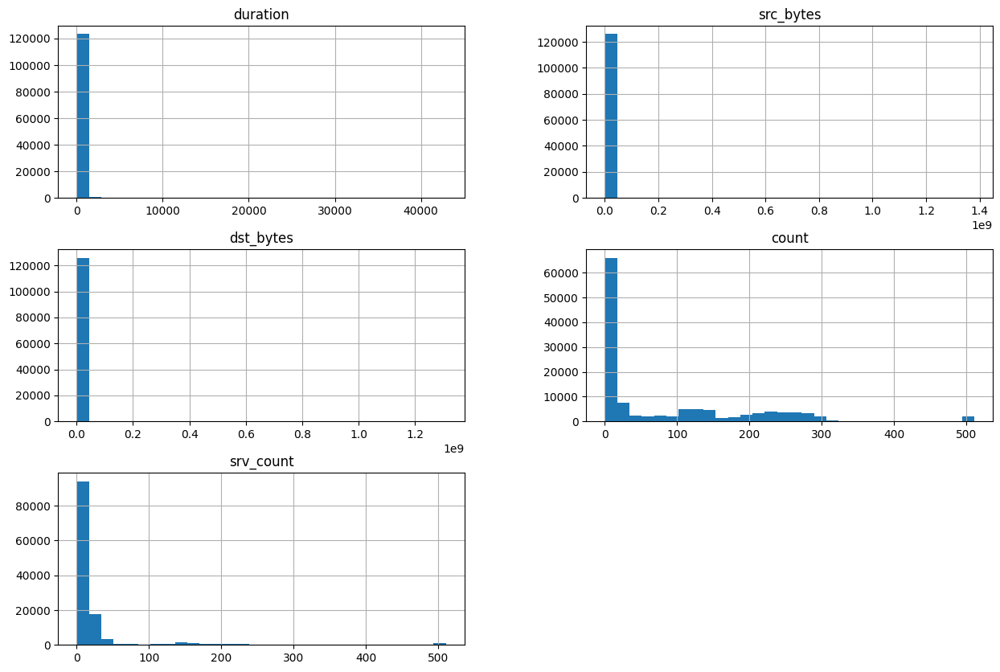

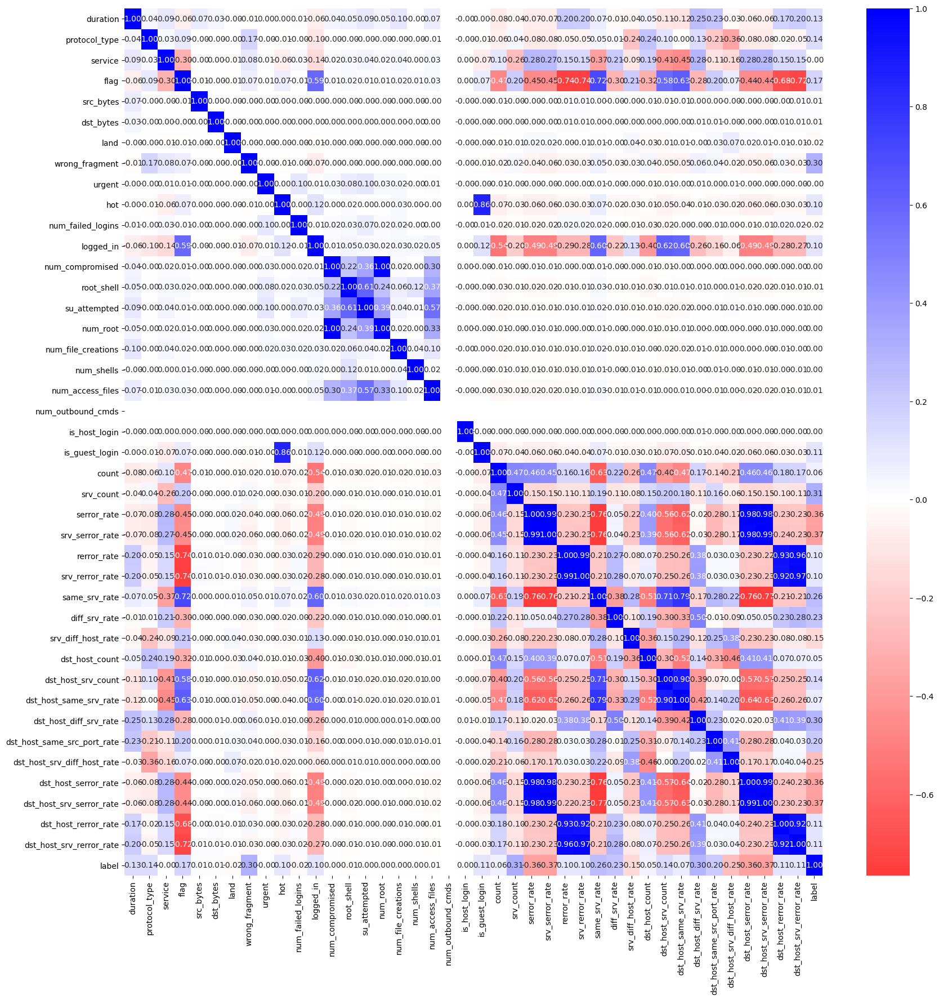

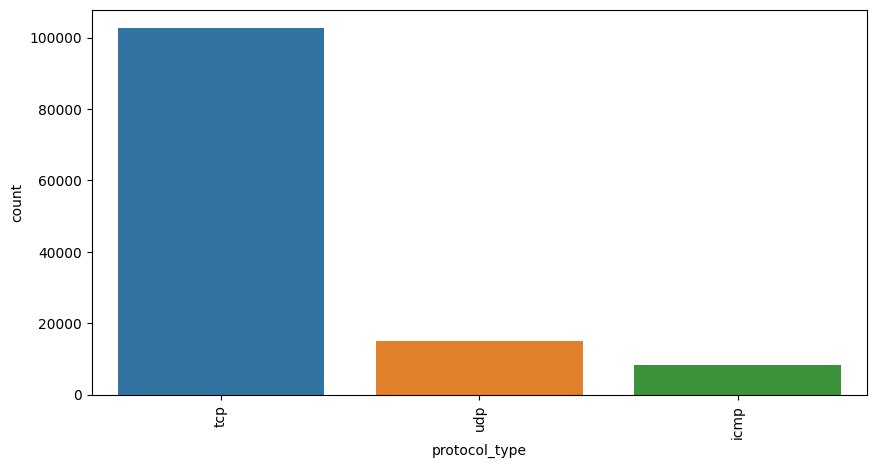

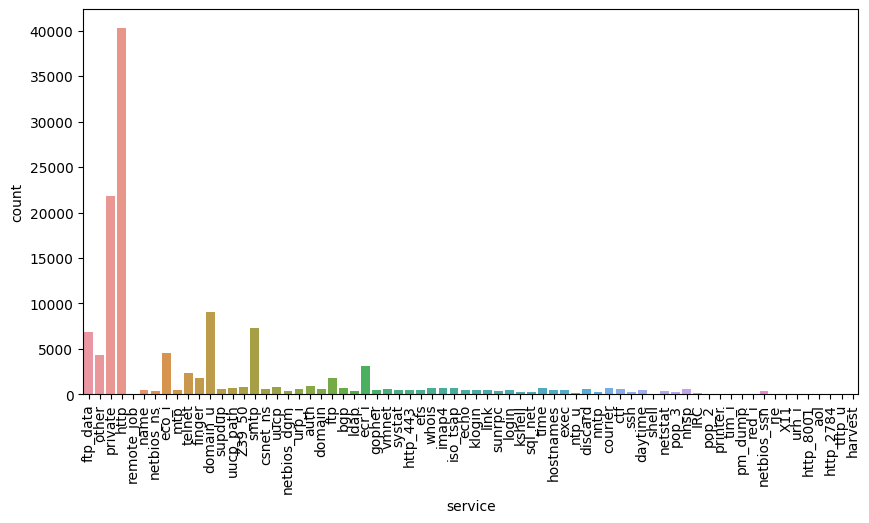

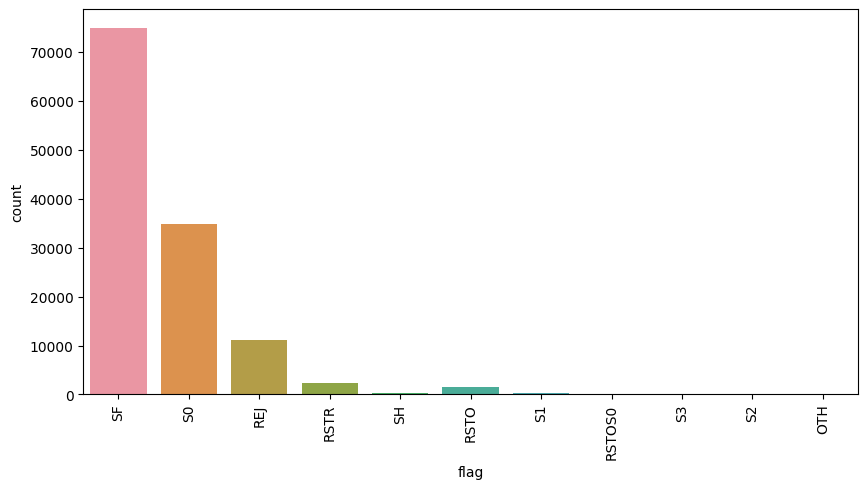

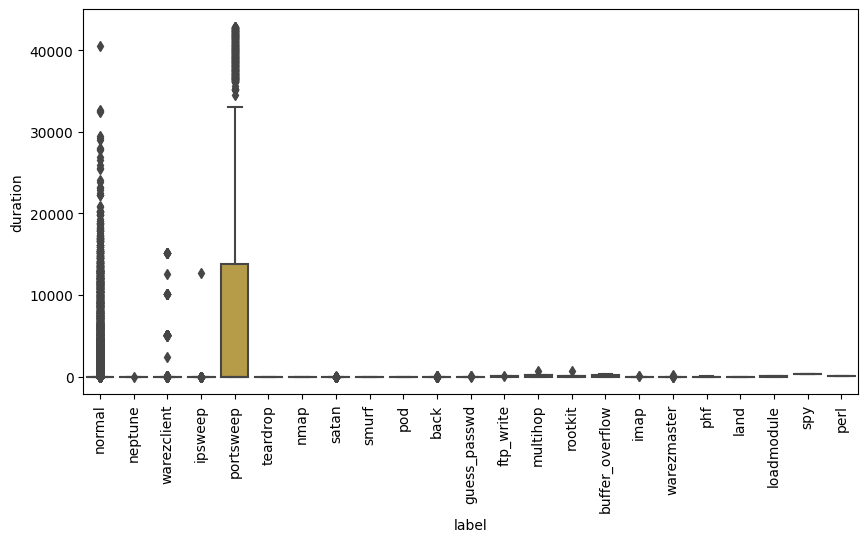

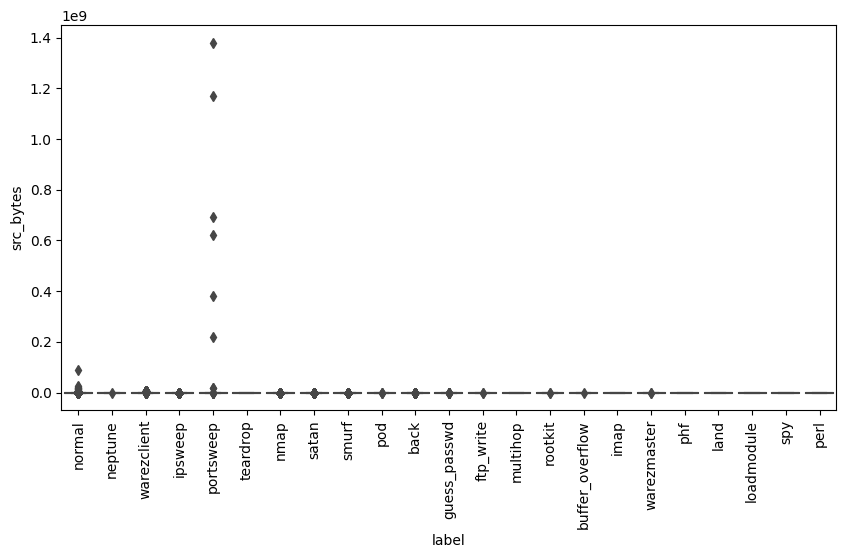

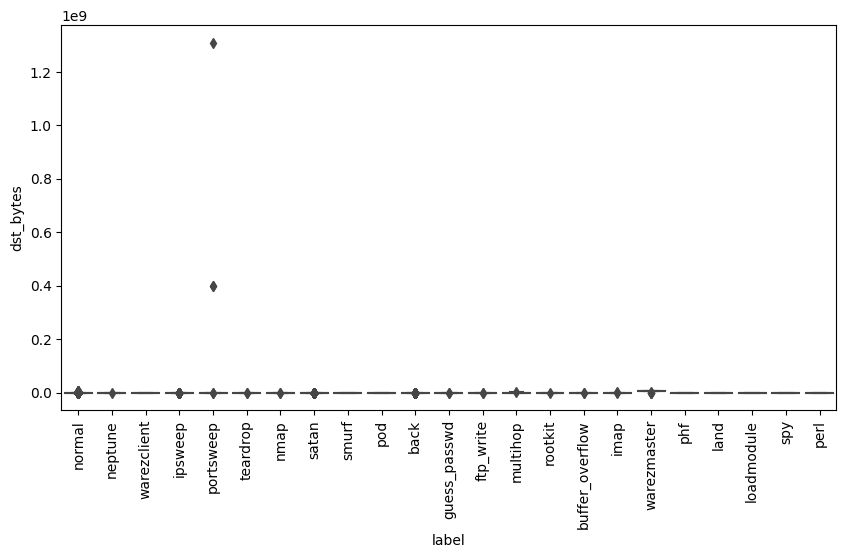

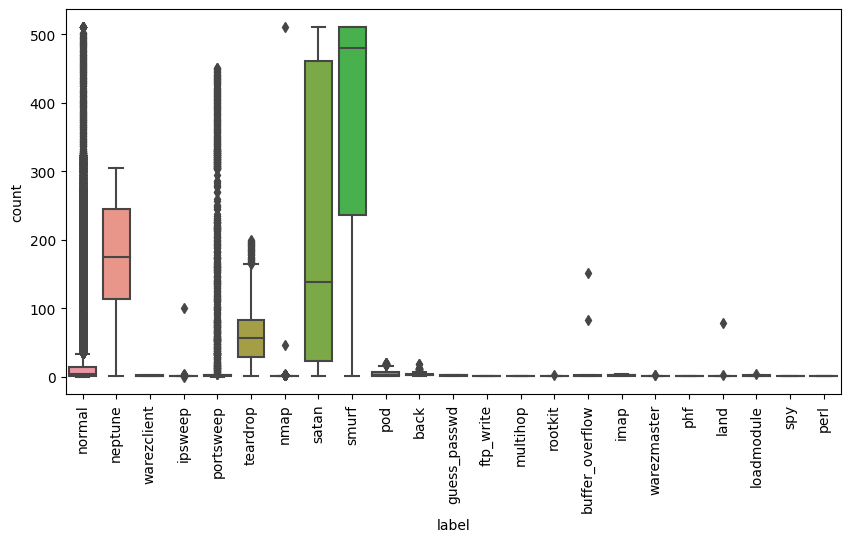

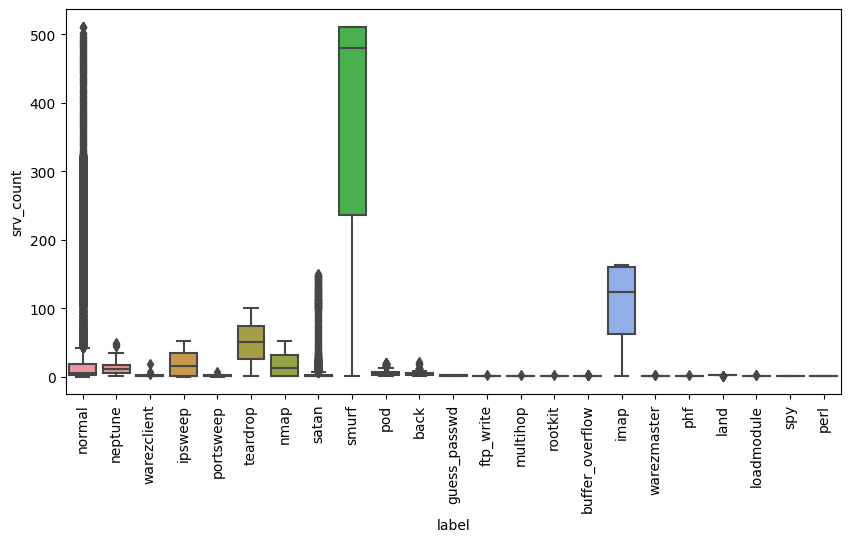

In [ ]:
# Visualize the distributions of numerical columns
num_columns = ["duration", "src_bytes", "dst_bytes", "count", "srv_count"]
df[num_columns].hist(bins=30, figsize=(15, 10))
plt.show()

# Create a heatmap for the correlation matrix
df_corr = df.copy()
labelencoder = LabelEncoder()
for col in discrete_columns+['label']:
    df_corr[col] = labelencoder.fit_transform(df_corr[col])
corr_matrix = df_corr.corr()
plt.figure(figsize=(20, 20))
cmap = colors.LinearSegmentedColormap.from_list("", ["red","white","blue"])
sns.heatmap(corr_matrix, annot=True, fmt='.2f', center=0, cmap=cmap)
plt.show()

# Count plots for categorical columns
for column in ["protocol_type", "service", "flag"]:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, x=column)
    plt.xticks(rotation=90)
    plt.show()

# Box plots for numerical columns against the 'label' column
for column in num_columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df, x='label', y=column)
    plt.xticks(rotation=90)
    plt.show()

In [ ]:
df_trimmed = df.copy()

# Get the correlation of 'label' column
abs_corr_matrix = corr_matrix.abs()
label_corr = abs_corr_matrix['label']

# Remove the 'label' correlation with itself
label_corr = label_corr[label_corr.index != 'label']

# Get top 15 features highly correlated with 'label'
top_label_corr = label_corr.sort_values(ascending=False)[:15]

top_attacks = df_trimmed['label'].value_counts().nlargest(50)

print(top_label_corr)
print(top_attacks)

# Use 6, 11, or 23 attacks
num_attacks_to_keep = 11
attack_to_keep = df_trimmed['label'].value_counts().nlargest(
    num_attacks_to_keep).index.tolist()
# MAKE SURE TO INCLUDE THE LABEL COLUMN BEFORE FITTING THE CTGAN
columns_to_keep = ['src_bytes', 'diff_srv_rate', 'dst_host_serror_rate', 'same_srv_rate', 'flag', 'count',
                   'dst_bytes', 'dst_host_diff_srv_rate', 'dst_host_srv_serror_rate', 'dst_host_srv_count',
                   'service', 'srv_serror_rate', 'dst_host_srv_diff_host_rate', 'serror_rate',
                   'dst_host_same_src_port_rate', 'dst_host_same_srv_rate', 'dst_host_rerror_rate',
                   'protocol_type', 'srv_count', 'dst_host_count', 'label']
df_trimmed = df_trimmed[df_trimmed['label'].isin(attack_to_keep)]
df_trimmed = df_trimmed[columns_to_keep]

df_test_copy = df_test.copy()
df_test_copy = df_test_copy[df_test_copy['label'].isin(attack_to_keep)]
df_test_copy = df_test_copy[columns_to_keep]

dst_host_srv_serror_rate       0.368981
srv_serror_rate                0.368207
dst_host_serror_rate           0.361695
serror_rate                    0.361326
srv_count                      0.310819
wrong_fragment                 0.304125
dst_host_diff_srv_rate         0.295042
same_srv_rate                  0.258357
dst_host_srv_diff_host_rate    0.253815
diff_srv_rate                  0.228557
dst_host_same_src_port_rate    0.202229
flag                           0.170749
srv_diff_host_rate             0.146615
dst_host_srv_count             0.138848
protocol_type                  0.135203
Name: label, dtype: float64
normal             67343
neptune            41214
satan               3633
ipsweep             3599
portsweep           2931
smurf               2646
nmap                1493
back                 956
teardrop             892
warezclient          890
pod                  201
guess_passwd          53
buffer_overflow       30
warezmaster           20
land                  

## CTGAN Model Testing

In [ ]:
float_columns = df_trimmed.select_dtypes(include=['float64']).columns
int_columns = df_trimmed.select_dtypes(include=['int64']).columns
cat_columns = ['protocol_type', 'service', 'flag', 'label', 'su_attempted']
bool_columns = ['land', 'logged_in', 'is_host_login', 'is_guest_login', 'root_shell']

for col in bool_columns:
    if col in df_trimmed.columns:
        df_trimmed[col] = df_trimmed[col].astype(bool)
        df_test_copy[col] = df_test_copy[col].astype(bool)

In [ ]:
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=df_trimmed)

for col in float_columns:
    if col in df_trimmed.columns:
        metadata.update_column(column_name=col, sdtype='numerical', computer_representation='Float')

for col in int_columns:
    if col in df_trimmed.columns:
        metadata.update_column(column_name=col, sdtype='numerical', computer_representation='Int64')

for col in cat_columns:
    if col in df_trimmed.columns:
        metadata.update_column(column_name=col, sdtype='categorical')

for col in bool_columns:
    if col in df_trimmed.columns:
        metadata.update_column(column_name=col, sdtype='boolean')

python_dict = metadata.to_dict()
metadata.validate()

In [ ]:
synthesizer = CTGANSynthesizer(metadata)

In [ ]:
model_file = '6-9_CTGAN_model_FullTrain_20Col_11Att.pkl'

# Code to train/fit the CTGAN, uncomment to retrain model
# Takes about 2-3 hours with full CPU use and partial GPU use

# synthesizer.fit(df_trimmed)
# with open(model_file, 'wb') as f:
#     pickle.dump(synthesizer, f)

In [ ]:
# Model File location: https://drive.google.com/file/d/1epJMyCvm5ut8UnjZPJNeEniOAIY-F0E3/view?usp=sharing
!gdown '1epJMyCvm5ut8UnjZPJNeEniOAIY-F0E3'
with open(model_file, 'rb') as f:
    synthesizer = pickle.load(f)

Downloading...
From: https://drive.google.com/uc?id=1epJMyCvm5ut8UnjZPJNeEniOAIY-F0E3
To: /content/6-9_CTGAN_model_FullTrain_20Col_11Att.pkl
100% 241M/241M [00:03<00:00, 68.8MB/s]


In [ ]:
# Generate same number of occurences as the original dataset
synthetic_data = synthesizer.sample(num_rows=125798)

In [ ]:
synthetic_data

,src_bytes,diff_srv_rate,dst_host_serror_rate,same_srv_rate,flag,count,dst_bytes,dst_host_diff_srv_rate,dst_host_srv_serror_rate,dst_host_srv_count,service,srv_serror_rate,dst_host_srv_diff_host_rate,serror_rate,dst_host_same_src_port_rate,dst_host_same_srv_rate,dst_host_rerror_rate,protocol_type,srv_count,dst_host_count,label
0,0,0.00,0.0,1.00,SF,13,0,0.00,0.0,254,domain_u,0.0,0.01,0.0,1.00,1.00,0.00,udp,10,32,normal
1,2945,0.06,1.0,0.07,S0,271,0,0.06,1.0,15,echo,1.0,0.00,1.0,0.00,0.06,0.00,tcp,9,255,neptune
2,0,0.00,0.0,1.00,SF,5,848,0.59,0.0,4,other,0.0,0.00,0.0,0.95,0.03,0.88,udp,3,255,normal
3,0,0.00,0.0,1.00,SF,0,5206,0.67,0.0,7,other,0.0,0.00,0.0,1.00,0.01,0.00,tcp,2,255,normal
4,4665,0.06,1.0,0.03,S0,190,0,0.08,1.0,5,echo,1.0,0.00,1.0,0.00,0.04,0.00,tcp,0,255,neptune
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125793,0,0.49,0.0,0.27,SF,2,947,0.02,0.0,4,other,0.0,0.00,0.0,0.86,0.02,0.11,icmp,16,255,pod
125794,0,0.00,0.0,1.00,SF,0,3531,0.58,0.0,4,other,0.0,0.00,0.0,0.95,0.01,0.00,tcp,2,255,normal
125795,1117,0.00,0.0,1.00,SF,0,7525,0.00,0.0,18,ftp_data,0.0,0.00,0.0,0.99,1.00,0.00,icmp,2,4,normal
125796,0,0.02,1.0,0.03,S0,214,0,0.06,1.0,8,ftp,1.0,0.00,1.0,0.00,0.15,0.00,tcp,16,254,neptune


In [ ]:
synthetic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125798 entries, 0 to 125797
Data columns (total 21 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   src_bytes                    125798 non-null  int64  
 1   diff_srv_rate                125798 non-null  float64
 2   dst_host_serror_rate         125798 non-null  float64
 3   same_srv_rate                125798 non-null  float64
 4   flag                         125798 non-null  object 
 5   count                        125798 non-null  int64  
 6   dst_bytes                    125798 non-null  int64  
 7   dst_host_diff_srv_rate       125798 non-null  float64
 8   dst_host_srv_serror_rate     125798 non-null  float64
 9   dst_host_srv_count           125798 non-null  int64  
 10  service                      125798 non-null  object 
 11  srv_serror_rate              125798 non-null  float64
 12  dst_host_srv_diff_host_rate  125798 non-null  float64
 13 

## Synthetic Data Analysis


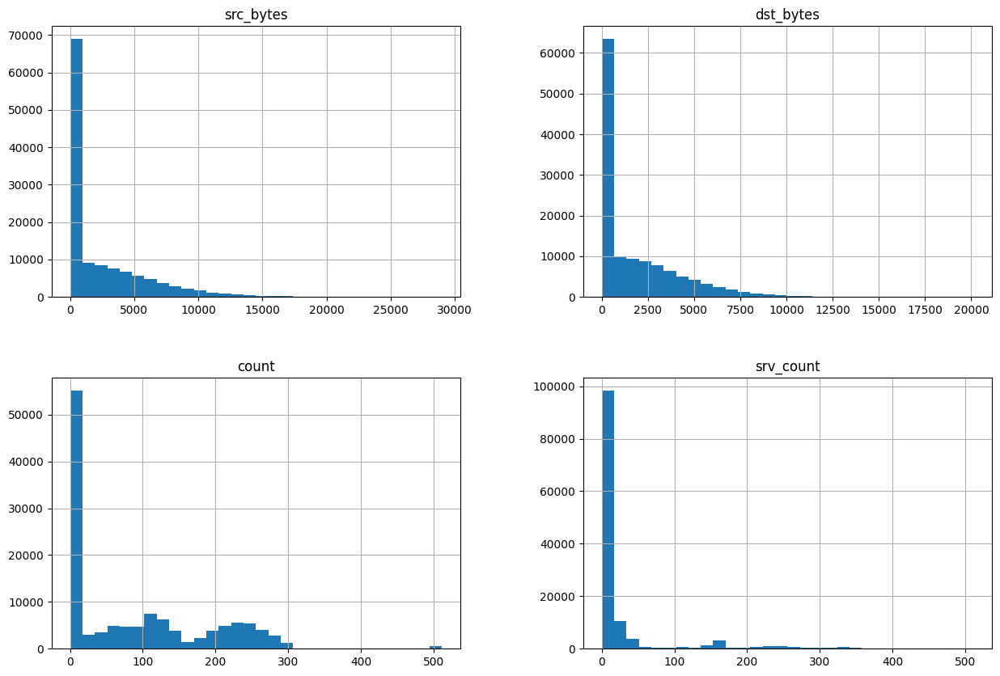

In [ ]:
# Visualize the distributions of basic numerical columns of Synthetic Data
num_columns = ["src_bytes", "dst_bytes", "count", "srv_count"]
synthetic_data[num_columns].hist(bins=30, figsize=(15, 10))
plt.show()

Text(0.5, 1.0, 'Correlation Matrix Heatmap of Synthetic dataset')

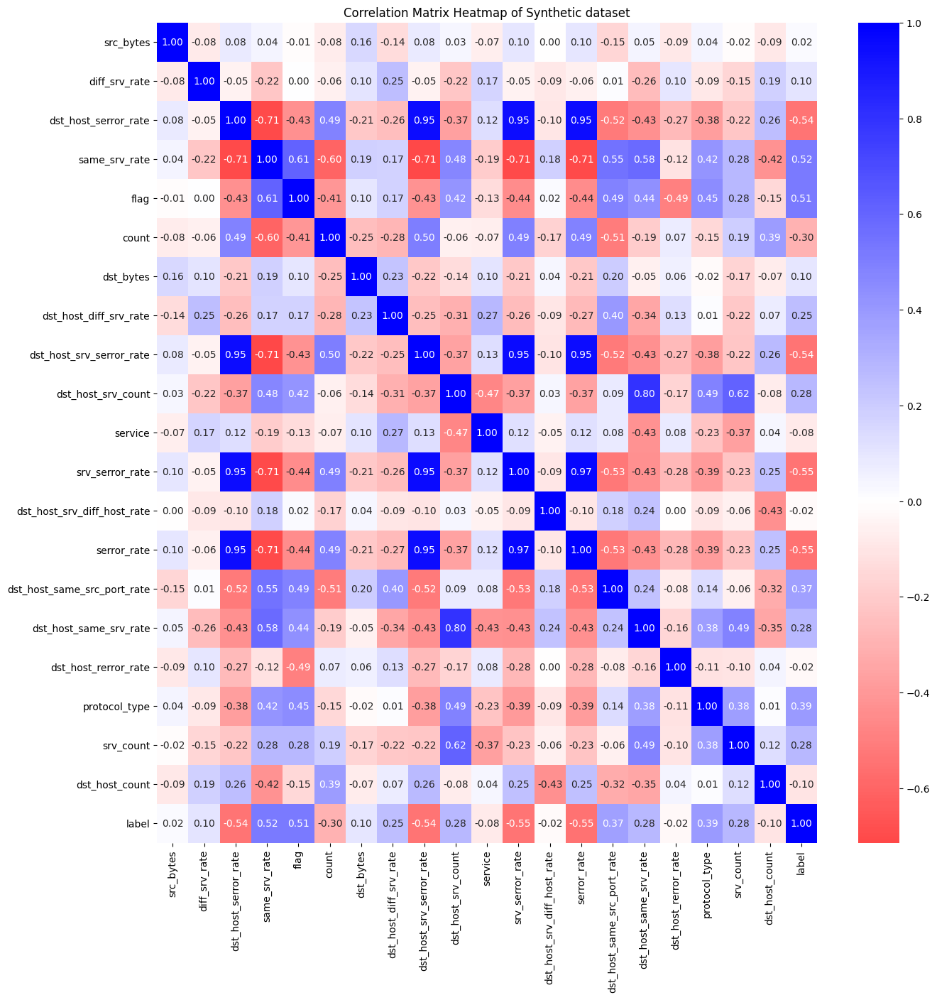

In [ ]:
# Create a copy of the synthetic data
syn_corr = synthetic_data.copy()
# Label encode the discrete columns
for col in discrete_columns + ['label']:
    if col in synthetic_data.columns:
        syn_corr[col] = labelencoder.fit_transform(syn_corr[col])
# Compute the correlation matrix
corr_matrix_syn = syn_corr.corr()
# Create a heatmap for the correlation matrix for Synthetic Data
plt.figure(figsize=(15, 15))
cmap = colors.LinearSegmentedColormap.from_list("", ["red", "white", "blue"])
sns.heatmap(corr_matrix_syn, annot=True, fmt='.2f', center=0, cmap=cmap)
plt.title("Correlation Matrix Heatmap of Synthetic dataset")

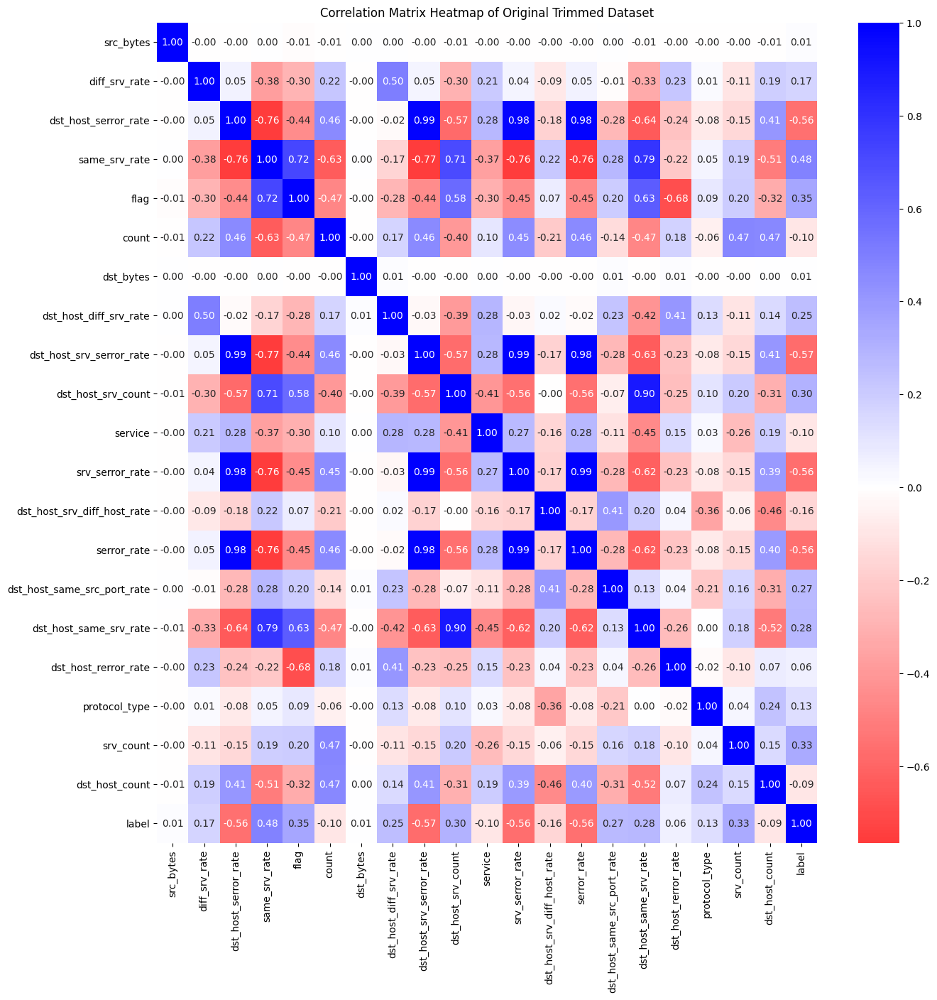

In [ ]:
# Heatmap of original dataset
df_corr = df_trimmed.copy()
# Encode the 'label' column
for col in discrete_columns + ['label']:
    if col in df_trimmed.columns:
        df_corr[col] = labelencoder.fit_transform(df_corr[col])
# Compute the correlation matrix
corr_matrix = df_corr.corr()
# Create a heatmap for the correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', center=0, cmap=cmap)
plt.title("Correlation Matrix Heatmap of Original Trimmed Dataset")
plt.show()

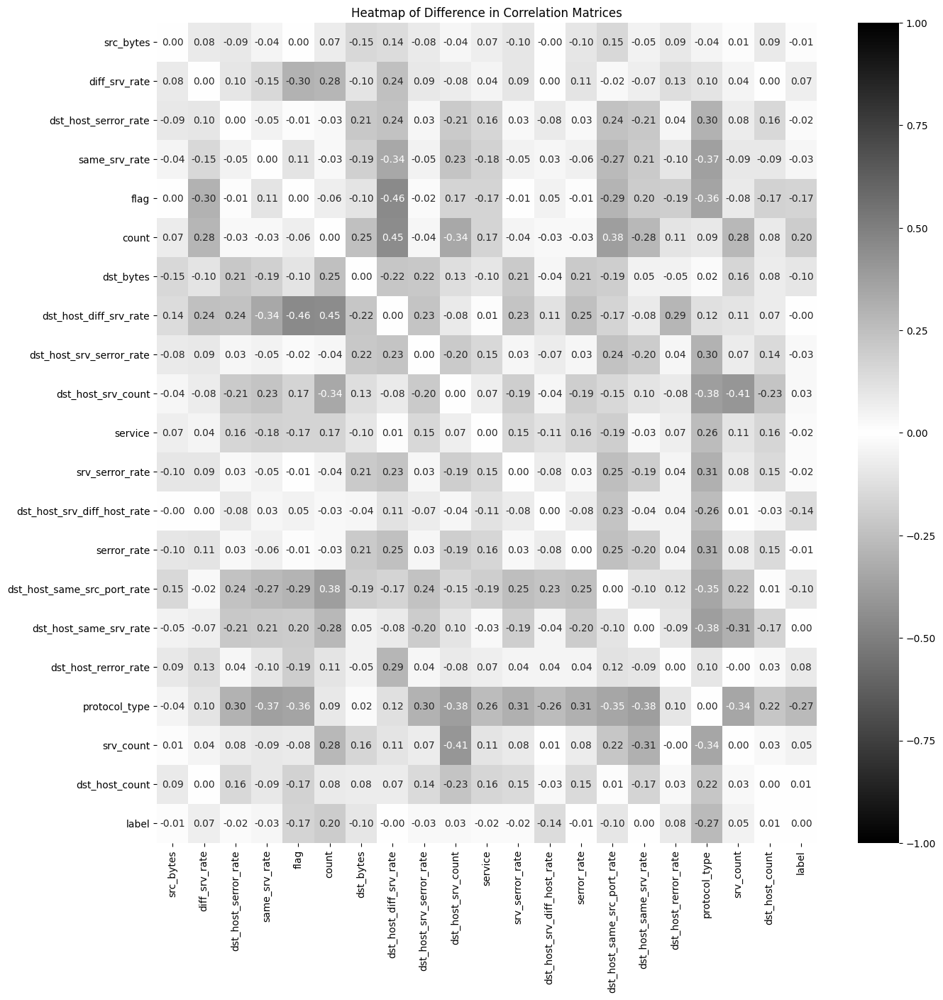

In [ ]:
# Compare_dataframes(df_trimmed, synthetic_data)
plt.figure(figsize=(15, 15))
cmap = colors.LinearSegmentedColormap.from_list("", ["black","white","black"])
sns.heatmap(corr_matrix - corr_matrix_syn, annot=True, fmt='.2f', center=0, cmap=cmap, vmin=-1, vmax=1)
plt.title("Heatmap of Difference in Correlation Matrices")
plt.show()

Looking at the histograms, the model reproduces the original data quite well. Our synthesis model does however exaggerate occurance counts for column values with low occurances. This is done while still retaining the distributions seen. This is best seen when comparing the original and synthetic histogram for count. The two bumps are seen in both, however it is exaggerated in the synthetic data.

Looking at the correlation heatmap, overall we seem to be reproducing much of the correlations found in the original dataset. We will verify this in later steps using SDV evaluation functions.

## Synthetic Data Analysis Using Random Forest Classifiers

We will create a baseline random forest classifier that we will train using mixtures of the original and synthetic data. This model will simply classify occurances as either normal or attack. The accuracy of these models will be plotted to show how our data impacts the model's accuracy.

In [ ]:
# 100% Original Data
original_data_df = df_trimmed.copy()

print(original_data_df.columns)
print(df_test_copy.columns)

rfle = LabelEncoder()
for col in ['flag', 'service', 'protocol_type', 'label']:
  original_data_df[col] = rfle.fit_transform(original_data_df[col])
  df_test_copy[col] = rfle.fit_transform(df_test_copy[col])

Index(['src_bytes', 'diff_srv_rate', 'dst_host_serror_rate', 'same_srv_rate',
       'flag', 'count', 'dst_bytes', 'dst_host_diff_srv_rate',
       'dst_host_srv_serror_rate', 'dst_host_srv_count', 'service',
       'srv_serror_rate', 'dst_host_srv_diff_host_rate', 'serror_rate',
       'dst_host_same_src_port_rate', 'dst_host_same_srv_rate',
       'dst_host_rerror_rate', 'protocol_type', 'srv_count', 'dst_host_count',
       'label'],
      dtype='object')
Index(['src_bytes', 'diff_srv_rate', 'dst_host_serror_rate', 'same_srv_rate',
       'flag', 'count', 'dst_bytes', 'dst_host_diff_srv_rate',
       'dst_host_srv_serror_rate', 'dst_host_srv_count', 'service',
       'srv_serror_rate', 'dst_host_srv_diff_host_rate', 'serror_rate',
       'dst_host_same_src_port_rate', 'dst_host_same_srv_rate',
       'dst_host_rerror_rate', 'protocol_type', 'srv_count', 'dst_host_count',
       'label'],
      dtype='object')


Full Real Accuracy: 0.9807866594163495
Full Real Precision: 0.7721244682503238
Full Real Recall: 0.9262234414033997
              precision    recall  f1-score   support

           0       1.00      0.83      0.91       359
           1       0.99      0.99      0.99       141
           2       1.00      1.00      1.00      4657
           3       1.00      1.00      1.00        73
           4       0.99      0.98      0.98      9711
           5       0.71      0.83      0.76        41
           6       0.79      0.99      0.88       157
           7       0.84      1.00      0.91       735
           8       1.00      1.00      1.00       665
           9       0.17      0.58      0.27        12
          10       0.00      0.00      0.00         0

    accuracy                           0.98     16551
   macro avg       0.77      0.84      0.79     16551
weighted avg       0.98      0.98      0.98     16551



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


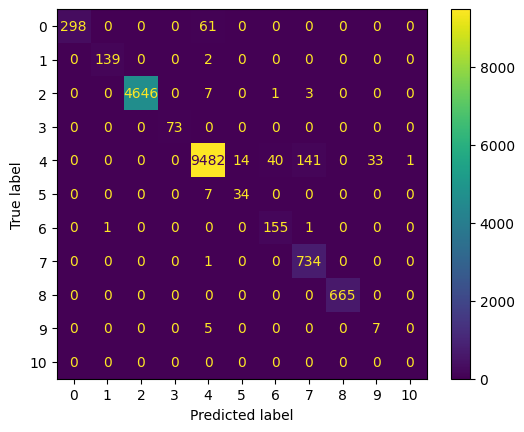

In [ ]:
X_train = original_data_df.drop('label', axis=1)
y_train = original_data_df['label']

X_test = df_test_copy.drop('label', axis=1)
y_test = df_test_copy['label']

rf = RandomForestClassifier(n_estimators=500, max_depth=10, n_jobs=-1)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print("Full Real Accuracy:",accuracy_score(y_test, y_pred))
print("Full Real Precision:",precision_score(y_test, y_pred, average='macro', zero_division=1))
print("Full Real Recall:",recall_score(y_test, y_pred, average='macro', zero_division=1))
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()
print(classification_report(y_test, y_pred))

Now we will try the following amounts of synthetic data:


*   25%
*   50%
*   75%
*   80%
*   85%
*   90%
*   95%
*   97%
*   99%
*   100%

in order to best understand our synthetic data's performance.

In [ ]:
# Prepare data for various synthetic splits
synth_encoded = synthetic_data.copy()
orig_encoded = original_data_df.copy()

for col in ['flag', 'service', 'protocol_type', 'label']:
  synth_encoded[col] = rfle.fit_transform(synth_encoded[col])

synth_encoded = synth_encoded.sample(frac=1)
orig_encoded = orig_encoded.sample(frac=1)

Used Hyperparmeter Gridsearch to determine n_estimators=500 and max_depth=10 for RFC. Default settings for RFC also worked fairly well.

In [ ]:
new_splits = [0.25, 0.5, 0.75, 0.8, 0.85, 0.9, 0.95, 0.97, 0.99, 1]

accuracies = []
precisions = []
recalls = []

for synthetic_amount in new_splits:
    synthetic_set = synth_encoded.sample(n=int(len(synthetic_data.index)*(synthetic_amount)))
    original_set = orig_encoded.sample(n=int(len(synthetic_data.index)*(1.0 - synthetic_amount)))
    full_mix = pd.concat([synthetic_set, original_set], axis=0)

    X_train = full_mix.drop('label', axis=1)
    y_train = full_mix['label']

    rf = RandomForestClassifier(n_estimators=500, max_depth=10, n_jobs=-1)

    rf.fit(X_train, y_train)
    print("Trained Model with", str(synthetic_amount*100)+"%", "synthetic data.")

    y_pred = rf.predict(X_test)
    accuracies.append(accuracy_score(y_test, y_pred))
    precisions.append(precision_score(y_test, y_pred, average='macro', zero_division=1))
    recalls.append(recall_score(y_test, y_pred, average='macro', zero_division=1))


Trained Model with 25.0% synthetic data.
Trained Model with 50.0% synthetic data.
Trained Model with 75.0% synthetic data.
Trained Model with 80.0% synthetic data.
Trained Model with 85.0% synthetic data.
Trained Model with 90.0% synthetic data.
Trained Model with 95.0% synthetic data.
Trained Model with 97.0% synthetic data.
Trained Model with 99.0% synthetic data.
Trained Model with 100% synthetic data.


Let's evaluate the performance of the model trained on 100% synthetic data when tested on the original dataset.

Confusion Matrix for Each Label - 100% Original Data Trained


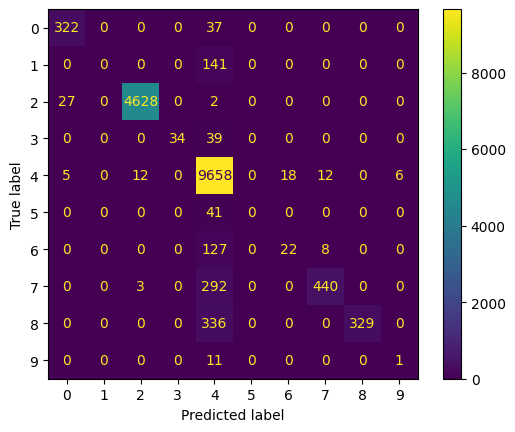

In [ ]:
print("Confusion Matrix for Each Label - 100% Original Data Trained")
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()

Now we can look at the change in accuracy, precision, and recall across the various amounts of real and synthetic data.

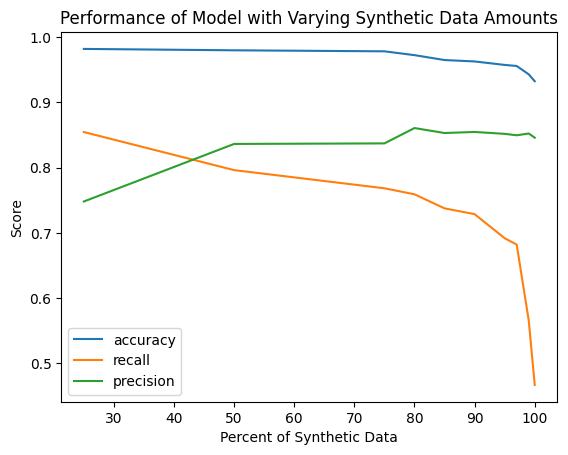

In [ ]:
# Conversion of split percentages to more readable format (0-100%)
plot_x = [i * 100 for i in new_splits]
plot_y = [accuracies, recalls, precisions]
metric_name = ['accuracy', 'recall', 'precision']
plt.xlabel("Percent of Synthetic Data")
plt.ylabel("Score")

plt.title("Performance of Model with Varying Synthetic Data Amounts")
for index in range(len(plot_y)):
  plt.plot(plot_x, plot_y[index], label = metric_name[index])

plt.legend()
plt.show()

In [ ]:
synthetic_set = synth_encoded.copy()
original_set = orig_encoded.copy()
full_mix = pd.concat([synthetic_set, original_set], axis=0)

X_train = full_mix.drop('label', axis=1)
y_train = full_mix['label']

rf = RandomForestClassifier(n_estimators=500, max_depth=10, n_jobs=-1)
rf.fit(X_train, y_train)
print("Trained Model with all all original training data and all synthetic data.")
y_pred = rf.predict(X_test)
print("Full Real & Synthetic Accuracy:",accuracy_score(y_test, y_pred))
print("Full Real & Synthetic Precision:",precision_score(y_test, y_pred, average='macro', zero_division=1))
print("Full Real & Synthetic Recall:",recall_score(y_test, y_pred, average='macro', zero_division=1))

Trained Model with all all original training data and all synthetic data.
Full Real & Synthetic Accuracy: 0.9806658207963265
Full Real & Synthetic Precision: 0.8057637339817516
Full Real & Synthetic Recall: 0.798375387483289


In this scenario, where we extended the original dataset with our generated synthetic data, the model performs better in terms of accuracy and precision on the test data set (partitioned and dropped from the original dataset). The recall does suffer a very small decrease.

This begins to confirm our hypothesis that the CTGAN model could be use to extend the original dataset. While this is promising, this result may not stand when all columns are used and so, this work provides a starting point for deeper works.

## Synthetic Data Analysis Using SDMetrics via SDV

In [ ]:
evaluate_quality(synthetic_data, df_trimmed, metadata)

Creating report: 100%|██████████| 4/4 [00:04<00:00,  1.20s/it]



Overall Quality Score: 83.93%

Properties:
Column Shapes: 82.7%
Column Pair Trends: 85.16%


The SDV quality evaluation tool allows us to quickly determine the quality of our synthetic data against the original trimmed data.

Overall, our synthetic data scored ~83.95% as we reproduced column shapes with ~82.73% quality and reproduced correlation in column pairs with ~85.18% quality.

In [ ]:
df_trimmed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 125798 entries, 0 to 125972
Data columns (total 21 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   src_bytes                    125798 non-null  int64  
 1   diff_srv_rate                125798 non-null  float64
 2   dst_host_serror_rate         125798 non-null  float64
 3   same_srv_rate                125798 non-null  float64
 4   flag                         125798 non-null  object 
 5   count                        125798 non-null  int64  
 6   dst_bytes                    125798 non-null  int64  
 7   dst_host_diff_srv_rate       125798 non-null  float64
 8   dst_host_srv_serror_rate     125798 non-null  float64
 9   dst_host_srv_count           125798 non-null  int64  
 10  service                      125798 non-null  object 
 11  srv_serror_rate              125798 non-null  float64
 12  dst_host_srv_diff_host_rate  125798 non-null  float64
 13 

In [ ]:
synthetic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125798 entries, 0 to 125797
Data columns (total 21 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   src_bytes                    125798 non-null  int64  
 1   diff_srv_rate                125798 non-null  float64
 2   dst_host_serror_rate         125798 non-null  float64
 3   same_srv_rate                125798 non-null  float64
 4   flag                         125798 non-null  object 
 5   count                        125798 non-null  int64  
 6   dst_bytes                    125798 non-null  int64  
 7   dst_host_diff_srv_rate       125798 non-null  float64
 8   dst_host_srv_serror_rate     125798 non-null  float64
 9   dst_host_srv_count           125798 non-null  int64  
 10  service                      125798 non-null  object 
 11  srv_serror_rate              125798 non-null  float64
 12  dst_host_srv_diff_host_rate  125798 non-null  float64
 13 

In [ ]:
import plotly.subplots as sp

# Generate figures
figures = []
for i, col in enumerate(df_trimmed.columns):
    fig = get_column_plot(
        real_data=df_trimmed,
        synthetic_data=synthetic_data,
        column_name=col,
        metadata=metadata
    )
    figures.append(fig)

# Define number of rows based on figures and required graphs per row
graphs_per_row = 3  # Change this to 2 if you want 2 graphs per row
rows = (len(figures) + graphs_per_row - 1) // graphs_per_row

# Create subplot object
fig = sp.make_subplots(rows=rows, cols=graphs_per_row)

# Add each figure to the subplot object
for i, figure in enumerate(figures):
    row = i // graphs_per_row + 1
    col = i % graphs_per_row + 1
    for trace in figure.data:
        fig.add_trace(trace, row=row, col=col)

# Show the subplot figure
fig.show()

In [ ]:
figures[1].show()

In [ ]:
figures[20].show()